<a href="https://colab.research.google.com/github/AndrewPiasecki/PythonCourse/blob/main/ProjectPart2MachineLearningUpdated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.datasets import cifar10
# Load Fashion MNIST dataset
(x_train, _), (_, _) = cifar10.load_data()

# Normalize the data
x_train = x_train.astype('float32') / 255.0

Epoch 1/100


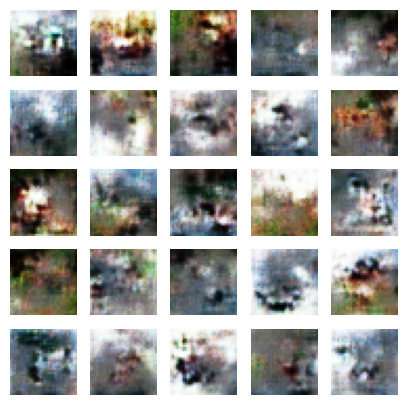

Epoch 2/100


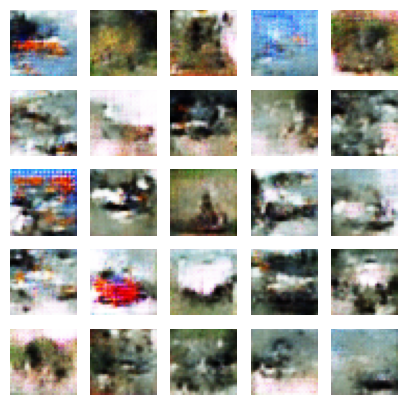

Epoch 3/100


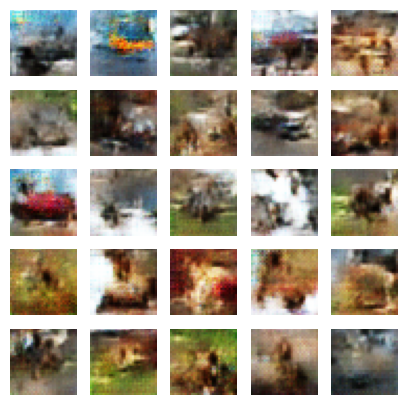

Epoch 4/100


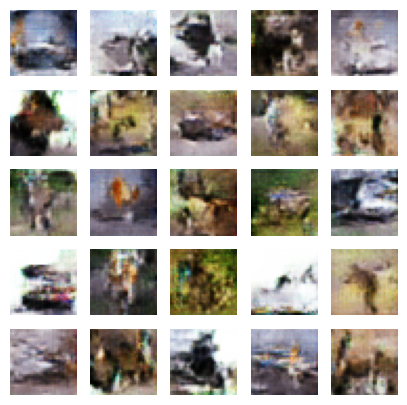

Epoch 5/100


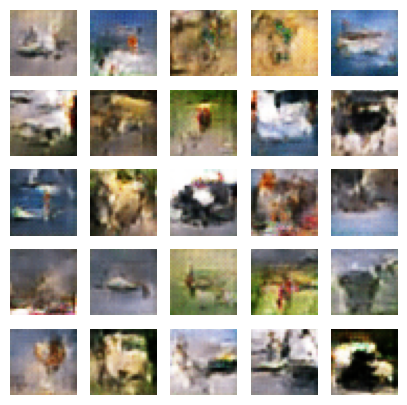

Epoch 6/100


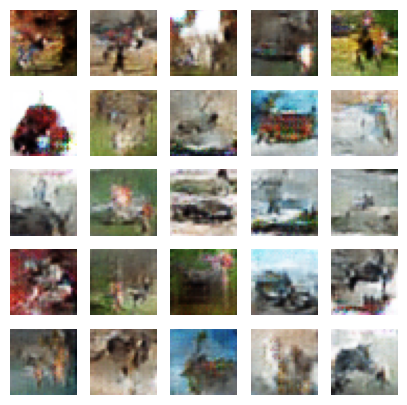

Epoch 7/100


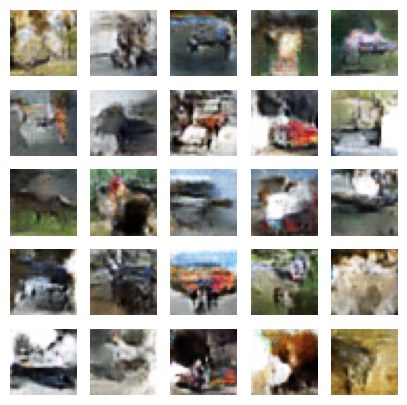

Epoch 8/100


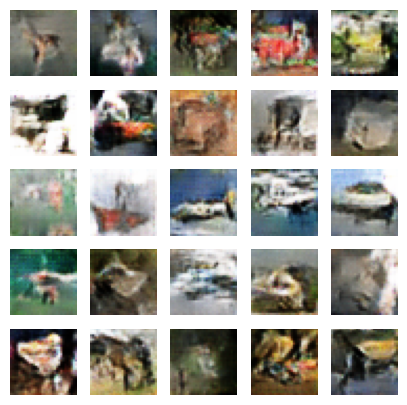

Epoch 9/100


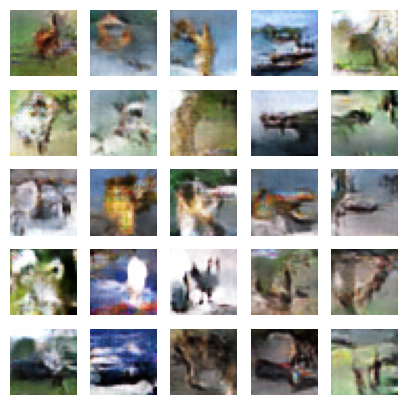

Epoch 10/100


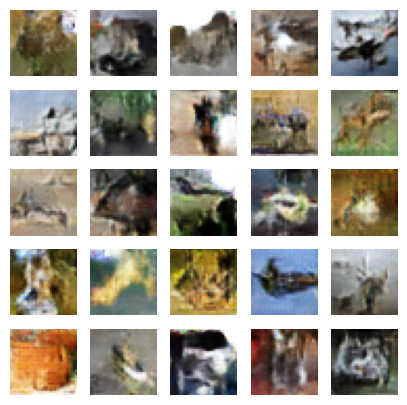

Epoch 11/100


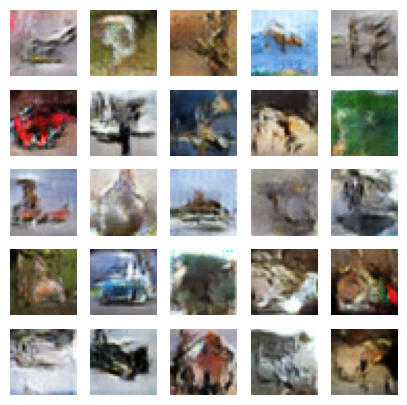

Epoch 12/100


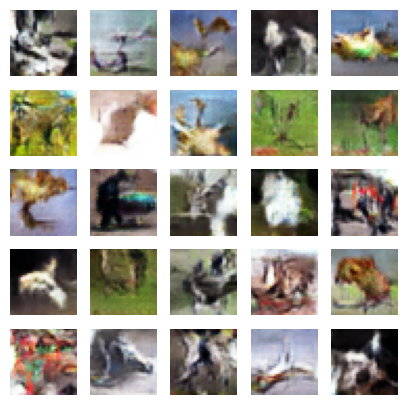

Epoch 13/100


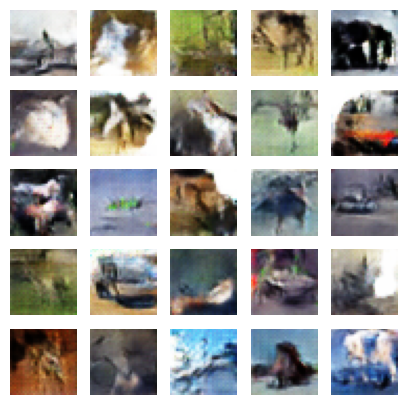

Epoch 14/100


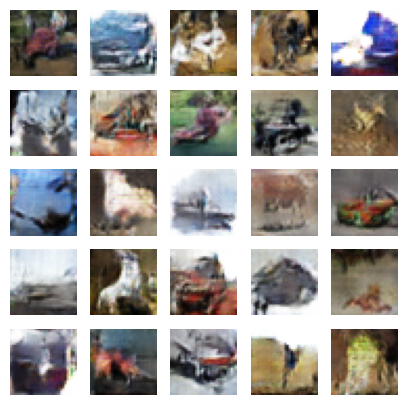

Epoch 15/100


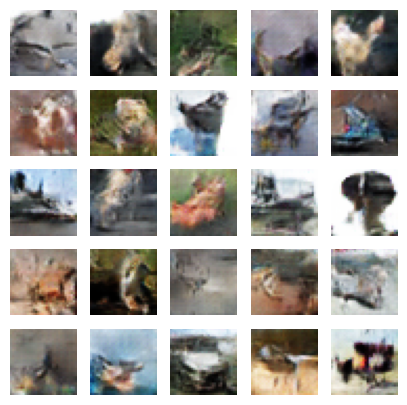

Epoch 16/100


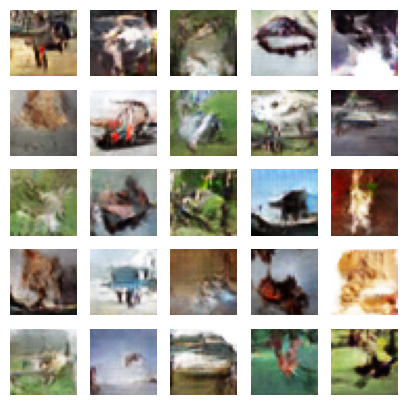

Epoch 17/100


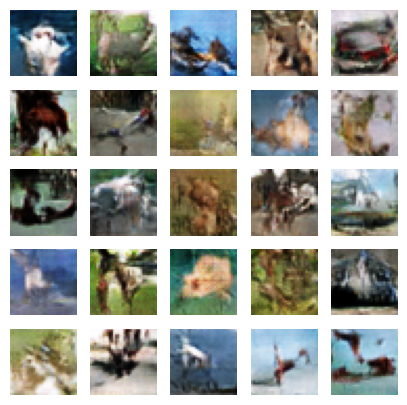

Epoch 18/100


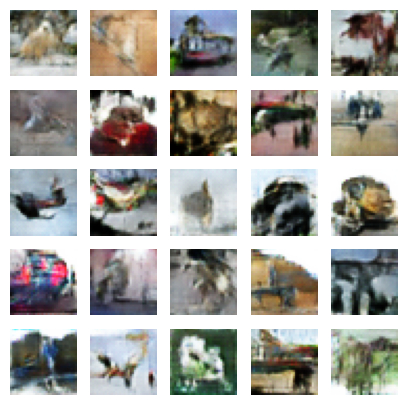

Epoch 19/100


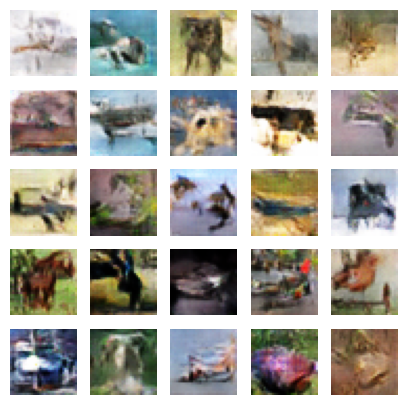

Epoch 20/100


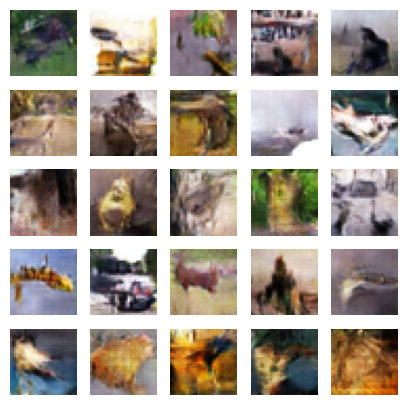

Epoch 21/100


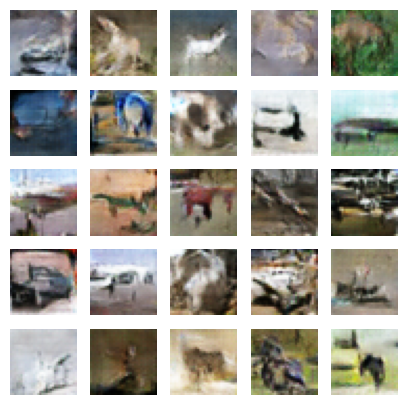

Epoch 22/100


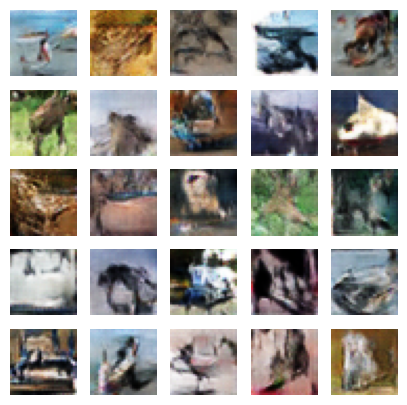

Epoch 23/100


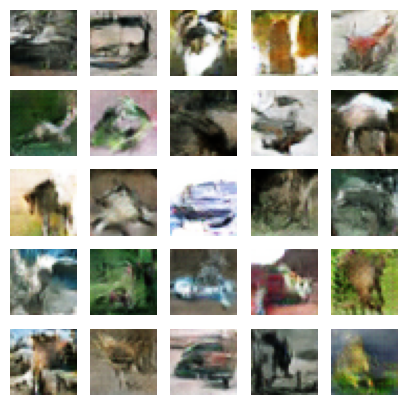

Epoch 24/100


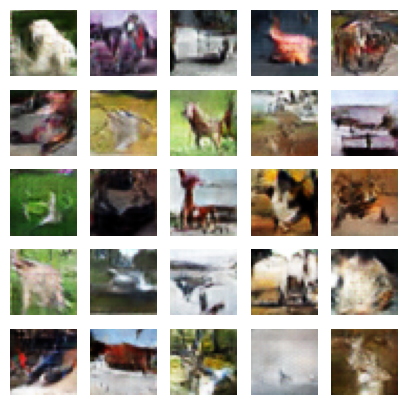

Epoch 25/100


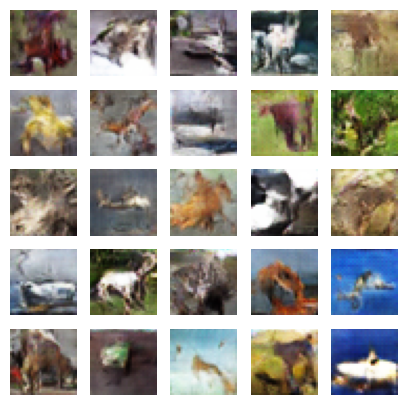

Epoch 26/100


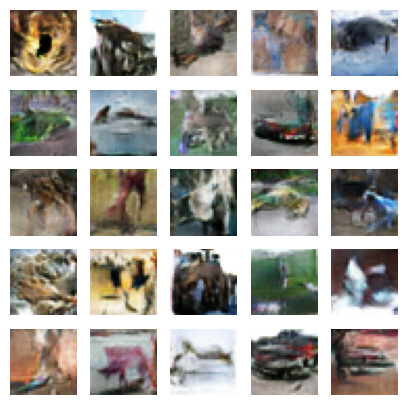

Epoch 27/100


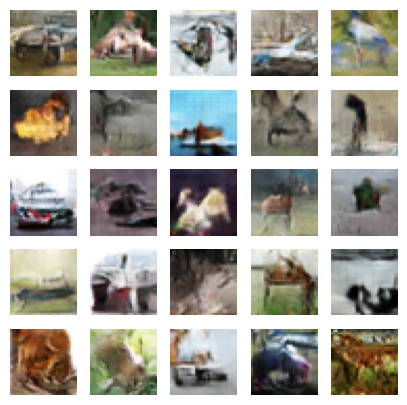

Epoch 28/100


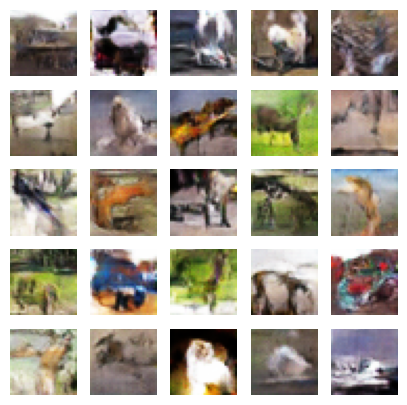

Epoch 29/100


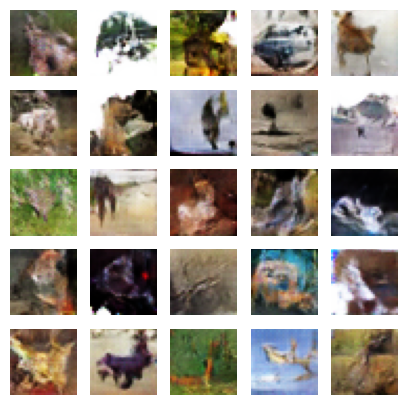

Epoch 30/100


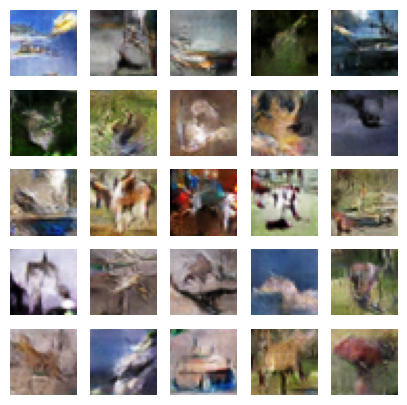

Epoch 31/100


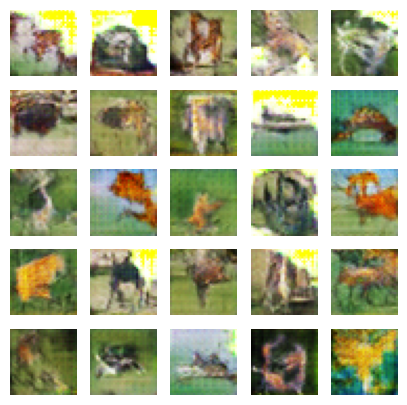

Epoch 32/100


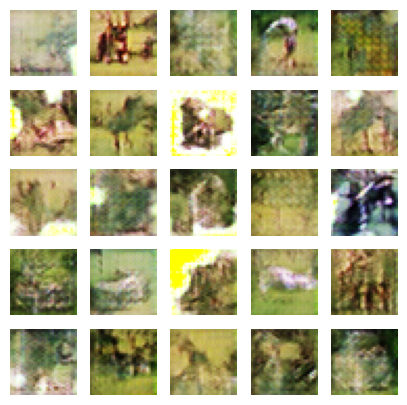

Epoch 33/100


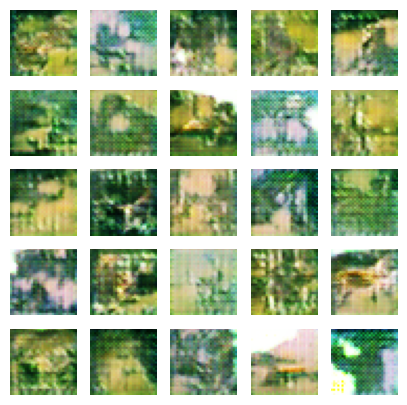

Epoch 34/100


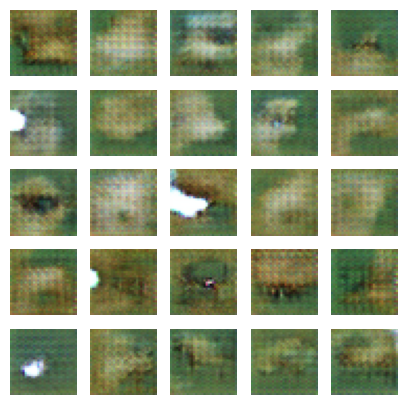

Epoch 35/100


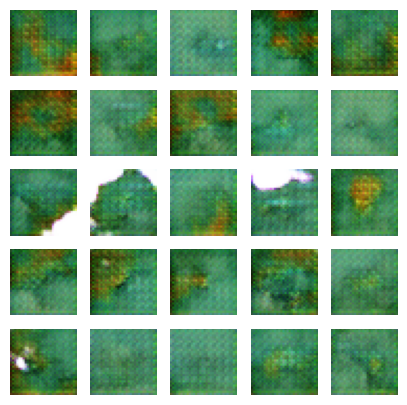

Epoch 36/100


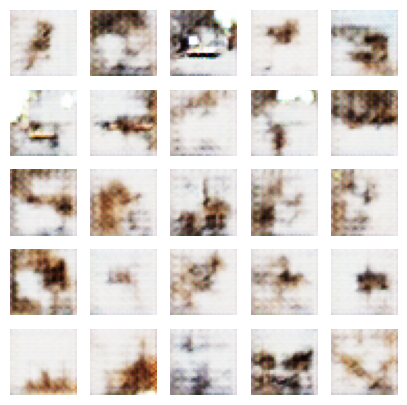

Epoch 37/100


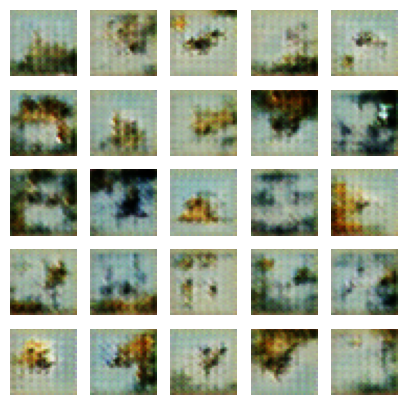

Epoch 38/100


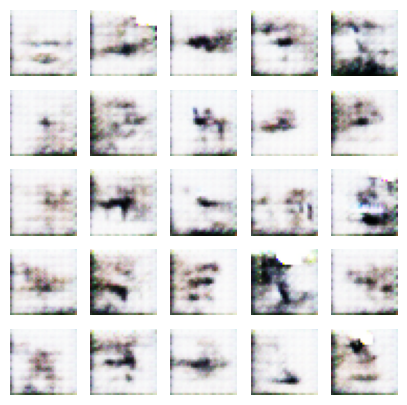

Epoch 39/100


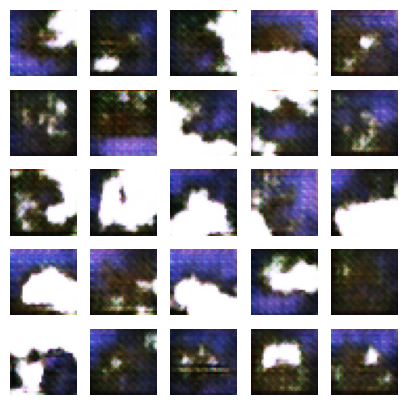

Epoch 40/100


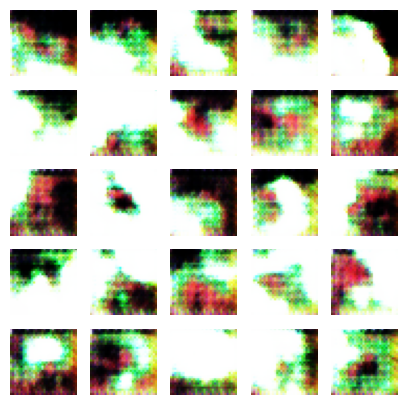

Epoch 41/100


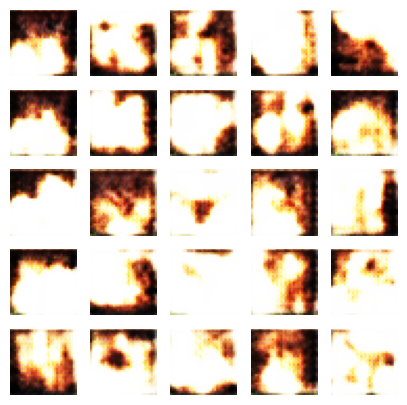

Epoch 42/100


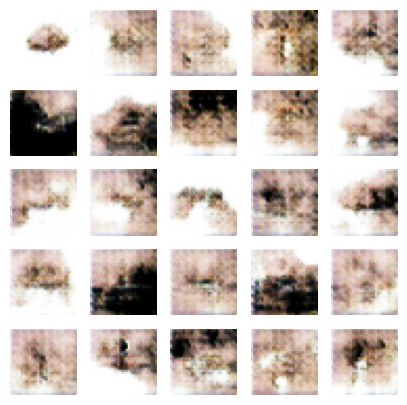

Epoch 43/100


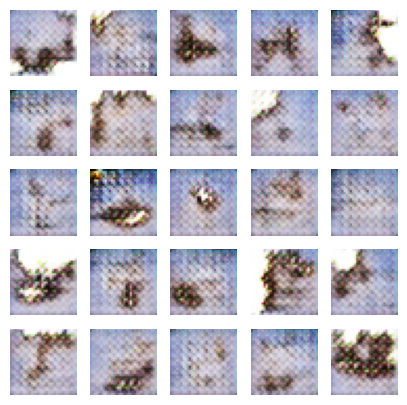

Epoch 44/100


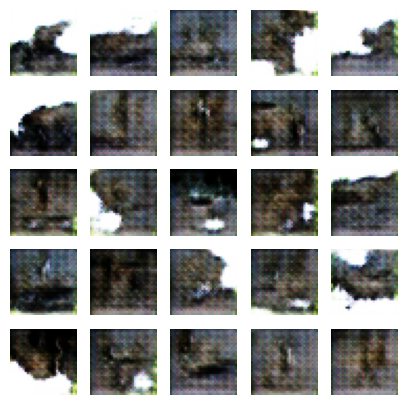

Epoch 45/100


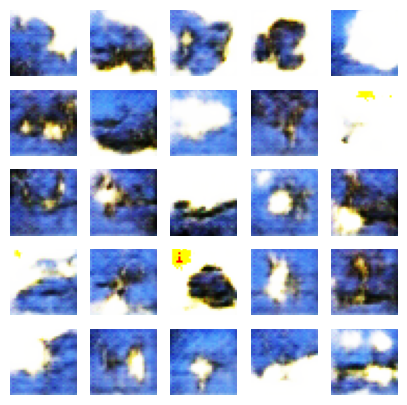

Epoch 46/100


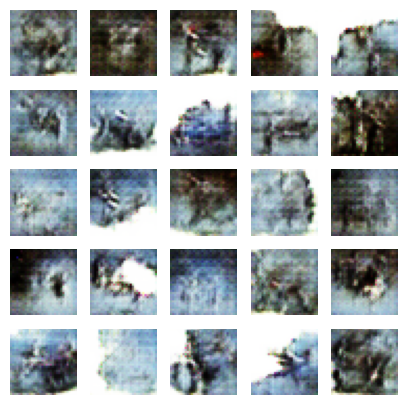

Epoch 47/100


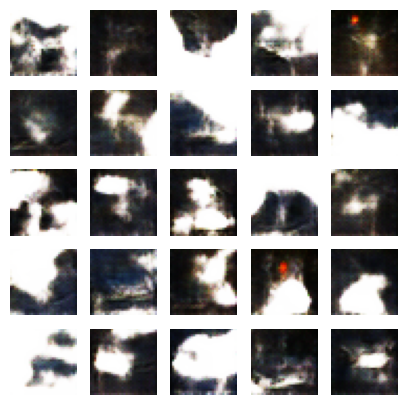

Epoch 48/100


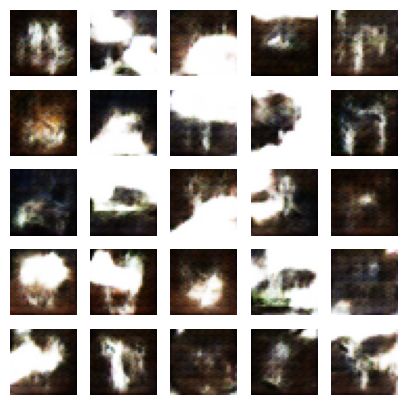

Epoch 49/100


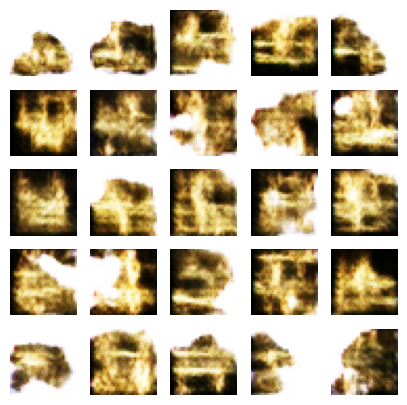

Epoch 50/100


KeyboardInterrupt: 

In [ ]:
# Define helper function to plot multiple images
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="gray", vmin=0, vmax=1)  # Adjusting colormap and pixel range
        plt.axis("off")

# Define the generator model
codings_size = 100

generator = tf.keras.Sequential([
    tf.keras.layers.Dense(8 * 8 * 256, activation="relu", kernel_initializer="he_normal", input_shape=(codings_size,)),
    tf.keras.layers.Reshape((8, 8, 256)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(3, kernel_size=3, strides=1, padding="same", activation="sigmoid")
])

# Define the discriminator model
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding="same", activation=tf.nn.leaky_relu, input_shape=[32, 32, 3]),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same", activation=tf.nn.leaky_relu),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=2, padding="same", activation=tf.nn.leaky_relu),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

# Define the GAN model
gan = tf.keras.Sequential([generator, discriminator])

# Compile the discriminator
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")

# The discriminator should not be trained during the second phase
discriminator.trainable = False

# Compile the GAN
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

# Create the training dataset
batch_size = 60  # Adjusted batch size
dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")
        for X_batch in dataset:
            # Phase 1 - Training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)

            # Phase 2 - Training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)
        # Plot images during training
        plot_multiple_images(generated_images.numpy()[:25], 5)  # Plotting grayscale images
        plt.show()

# Train the GAN
train_gan(gan, dataset, batch_size, codings_size, n_epochs=100)

